# Setup for Image Processing

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimage

import cv2
import numpy as np

import os
from math import sqrt

# 1. Thresholding


## Read the Numbers Image

(<matplotlib.image.AxesImage at 0x7f7f48dd26d8>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

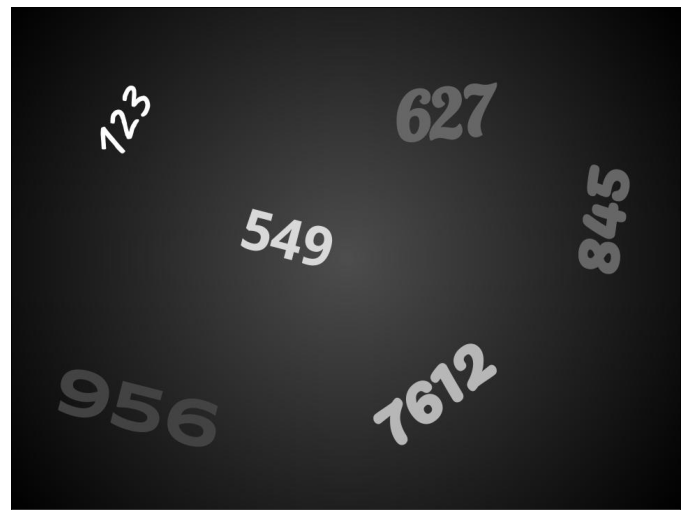

In [ ]:
# Get the path of the notebook
BASE_DIR = os.path.dirname(os.path.abspath('assignment_1.ipynb'))

# Read numbers.jpg image
numbers_image = mpimage.imread(os.path.join(BASE_DIR, 'numbers.jpg'))

# plot the image to check if it is read correctly
plt.figure(figsize=(12, 12))
plt.imshow(numbers_image), plt.xticks([]), plt.yticks([])

## Change the Image to Grayscale

(<matplotlib.image.AxesImage at 0x7f7f468f0e80>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

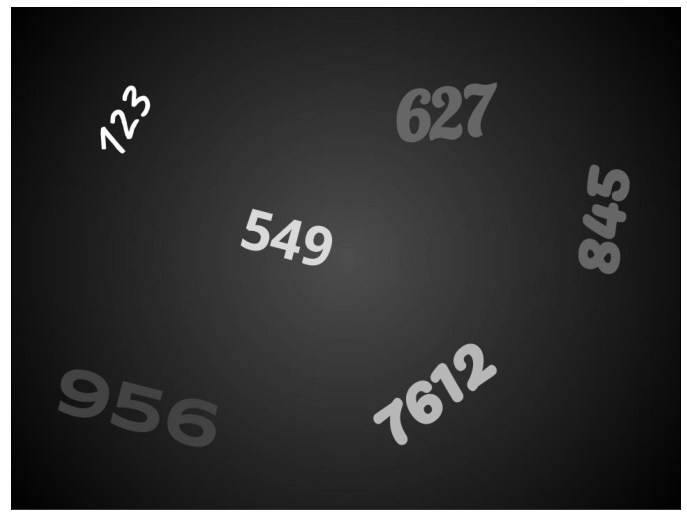

In [ ]:
# change color of the image into grayscale
gray_numbers = cv2.cvtColor(numbers_image, cv2.COLOR_RGB2GRAY)

# plot the grayscale image to check if it is converted correctly
plt.figure(figsize=(12, 12))
plt.imshow(gray_numbers, cmap='gray'), plt.xticks([]), plt.yticks([])

## Apply Thresholding at T=55


(Text(0.5, 1.0, 'Inverse Binary Thresholding at T=55'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

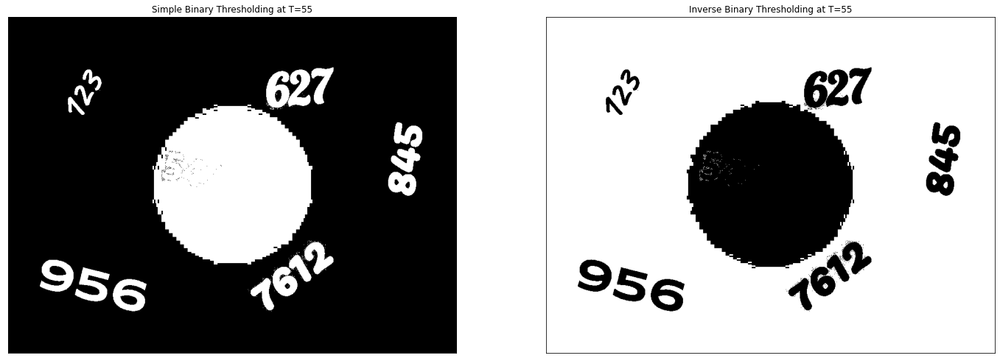

In [ ]:
# apply the simple binary thresholding to the gray image at T = 55
t_55 = gray_numbers > 55

# apply the inverse binary thresholding to the gray image at T = 55
i_55 = gray_numbers < 55

# display the results
plt.figure(figsize=(24, 24))
plt.subplot(121), plt.imshow(t_55, cmap='gray')
plt.title('Simple Binary Thresholding at T=55'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(i_55, cmap='gray')
plt.title('Inverse Binary Thresholding at T=55'), plt.xticks([]), plt.yticks([])

## Apply Thresholding at T=90

(Text(0.5, 1.0, 'Inverse Binary Thresholding at T=90'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

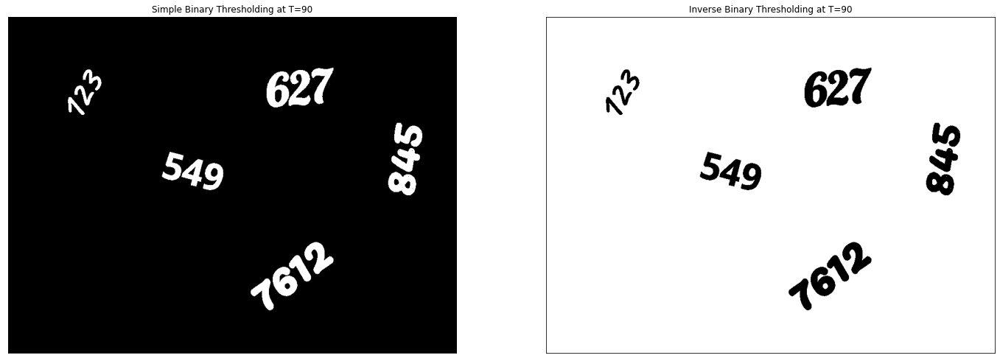

In [ ]:
# apply the simple binary thresholding to the gray image at T = 90
t_90 = gray_numbers > 90

# apply the inverse binray thresholding to the gray image at T = 90
i_90 = gray_numbers < 90

# display the results
plt.figure(figsize=(24, 24))
plt.subplot(121), plt.imshow(t_90, cmap='gray')
plt.title('Simple Binary Thresholding at T=90'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(i_90, cmap='gray')
plt.title('Inverse Binary Thresholding at T=90'), plt.xticks([]), plt.yticks([])

## Apply Thresholding at T=150

(Text(0.5, 1.0, 'Inverse Binary Threshold at T=150'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

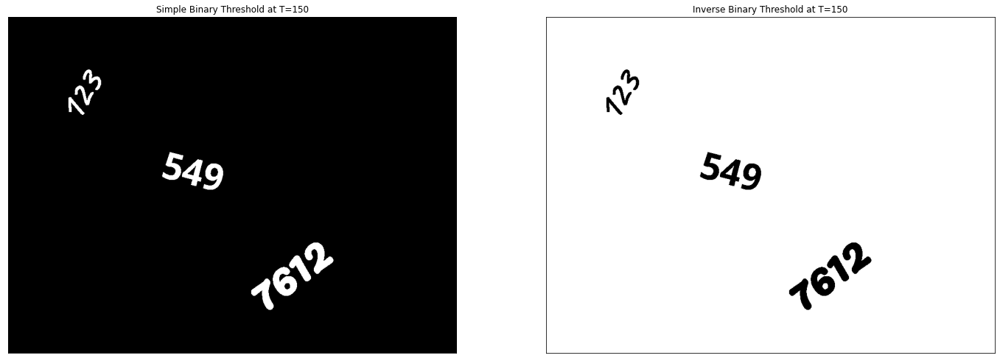

In [ ]:
# apply the simple binary threshold to the gray image for T = 150
t_150 = gray_numbers > 150

# apply the inverse binary threshold to the gray image for T = 150
i_150 = gray_numbers < 150

# display the results
plt.figure(figsize=(24, 24))
plt.subplot(121), plt.imshow(t_150, cmap='gray')
plt.title('Simple Binary Threshold at T=150'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(i_150, cmap='gray')
plt.title('Inverse Binary Threshold at T=150'), plt.xticks([]), plt.yticks([])

## Observations About Thresholded Images at Different Thresholds

- For the first threshold level T = 55, we get all of the numbers and the light affect in the middle of the photo. Therefore, for T = 55, the threshold level is at such a point that it picks up all of the non-black pixels. Also, it is visible that some random pixels around the numbers are also picked up by the threshold and turned into white. This makes it look like the result is noisy.

- For the second threshold level T = 90, we are picking up most of the numbers except the number "956" on the lower left corner. We also do not see the light effect in the middle of the picture, we get white numbers with a black background.

- For the last threshold level T = 150, we only get three numbers showing up. These are "123", "549" and "7612". We can say that this threshold only picked up the numbers that are closers to the white rather than the gray numbers. There is also less noise (noise as in random white pixels that do not for any recognizable patterns).

## Apply Window Binary Thresholding

(Text(0.5, 1.0, 'Window Binary Thresholding for T1=55 and T2=150'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

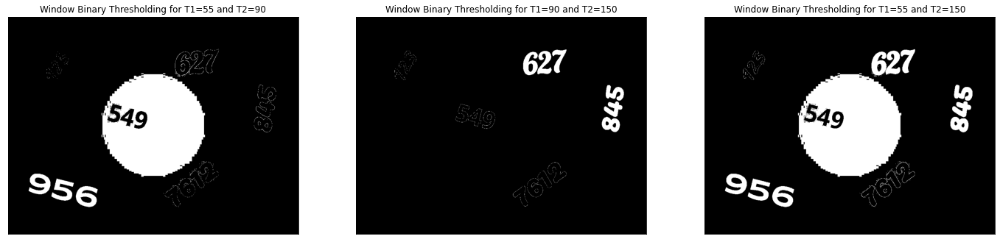

In [ ]:
# apply window binary thresholding for T1 = 55 and T2 = 90
wbt_55_90 = []
for row in gray_numbers:
  t_row = []
  for pixel in row:
    if 55 < pixel < 90:
      t_row.append(255)
    else:
      t_row.append(0)
  wbt_55_90.append(t_row)

# apply window binary thresholding for T1 = 90 and T2 = 150
wbt_90_150 = []
for row in gray_numbers:
  t_row = []
  for pixel in row:
    if 90 < pixel < 150:
      t_row.append(255)
    else:
      t_row.append(0)
  wbt_90_150.append(t_row)

# apply window binary thresholding for T1 = 55 and T2 = 150
wbt_55_150 = []
for row in gray_numbers:
  t_row = []
  for pixel in row:
    if 55 < pixel < 150:
      t_row.append(255)
    else:
      t_row.append(0)
  wbt_55_150.append(t_row)

# display the results
plt.figure(figsize=(24, 24))
plt.subplot(131), plt.imshow(wbt_55_90, cmap='gray')
plt.title('Window Binary Thresholding for T1=55 and T2=90'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(wbt_90_150, cmap='gray')
plt.title('Window Binary Thresholding for T1=90 and T2=150'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(wbt_55_150, cmap='gray')
plt.title('Window Binary Thresholding for T1=55 and T2=150'), plt.xticks([]), plt.yticks([])

## Observations About Window Binary Thresholding

- For the first threshold window of T1 = 55 and T2 = 90, only the light effect in the middle and the number 956 are turned into white. We can also see the outlines of the other numbers, white outline and black filling. Since this thresholding only highlights the pixels that are between 55 and 90, only their shadows got highlighted and show up as white outlines. Only the number "956" is segmented at this threshold.

- For the second threshold window of T1 = 90 and T2 = 150, we have two segmented numbers which are "627" and "845". The outline of the numbers can be seen but this does not count as segmentation. We can see that the white circle from the light effect does not segment in this window compared to the first window, which means that the colour values of those pixels were between 55 and 90.

- For the last threshold window of T1 = 55 and T2 = 150, we can see that we get a resulting image that is the union of first and the second window thresholding. Numbers "956", "627" and "845" are segmented in this image and the light circle is also segmented.

## Threshold to Get Numbers 123 and 549 from the Image

(Text(0.5, 1.0, 'Simple Binary Thresholding for T=225'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

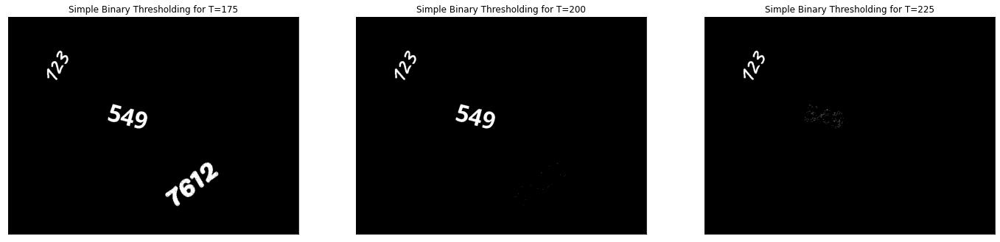

In [ ]:
# apply simple binary thresholding for T = 175
t_160 = gray_numbers > 175

# apply simple binary thresholding for T = 200
t_200 = gray_numbers > 200

# apply simple binary thresholding for T = 225
t_225 = gray_numbers > 225

# display the results
plt.figure(figsize=(24, 24))
plt.subplot(131), plt.imshow(t_160, cmap='gray')
plt.title('Simple Binary Thresholding for T=175'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(t_200, cmap='gray')
plt.title('Simple Binary Thresholding for T=200'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(t_225, cmap='gray')
plt.title('Simple Binary Thresholding for T=225'), plt.xticks([]), plt.yticks([])

I started by looking at the results of the Simple Binary Thresholding we did in question 1. For a threshold value of T = 150, we see that only the numbers "123", "549" and "7612" segment. This showed me that I needed a higher threshold value than 150 to only segment the number "123" and "549". I continued doing Simple Binary Thresholding with three different threshold values that are higher tha n150.

- First value I picked is T = 175. I applied the simple binary thresholding with this value and noticed that number "7612" is still segmented. This meant that I needed to find a value that is higher than 175.

- As the second threshold value, I picked T = 200. When I applied simple binary thresholding with this value, I noticed that only the numbers "123" and "549" are segmented as in Figure 1(b) of the Assignment 1 pdf. I found that this is the correct thresholding value to only segment the numbers "123" and "549".

- For the last value, I wanted to check if the two numbers are still segmented for a threshold value higher than 200. Therefore, I picked T = 225 as the last value. This time, the resulting image only had "123" segmented. Therefore, I concluded that a thresholding value roughly between 200 and 225 is a good a value to segment the numbers "123" and "549".

# 2. Denoising

## Read the Noisy Lighthouse Image

(<matplotlib.image.AxesImage at 0x7f7f465c4898>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

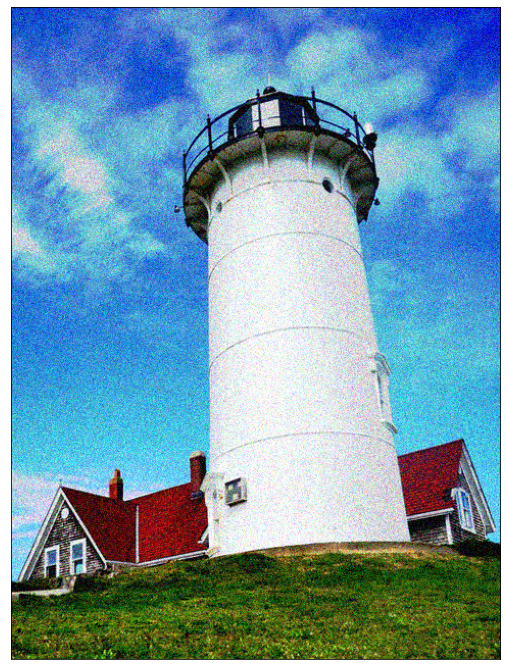

In [ ]:
# Read lighthouse.png image 
lighthouse = mpimage.imread(os.path.join(BASE_DIR, 'gaussian_lighthouse.png'))

# plot the image to see if it is read correctly
plt.figure(figsize=(12, 12))
plt.imshow(lighthouse), plt.xticks([]), plt.yticks([])

## Change the Image to Grayscale

(<matplotlib.image.AxesImage at 0x7f7f4657bc50>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

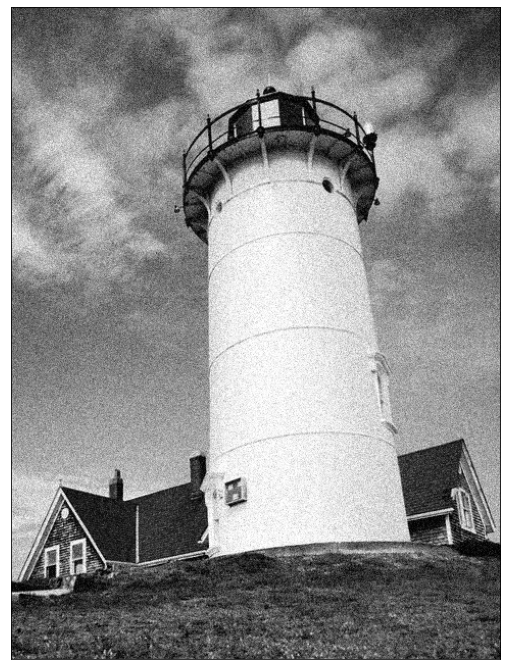

In [ ]:
# change the image to grayscale
gray_lighthouse = cv2.cvtColor(lighthouse, cv2.COLOR_RGB2GRAY)

# display the results to check if it is done correctly
plt.figure(figsize=(12, 12))
plt.imshow(gray_lighthouse, cmap='gray'), plt.xticks([]), plt.yticks([])

## Apply 5x5 Gaussian Filter with variance of 2

(Text(0.5, 1.0, 'After 5x5 Gaussian Filter'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

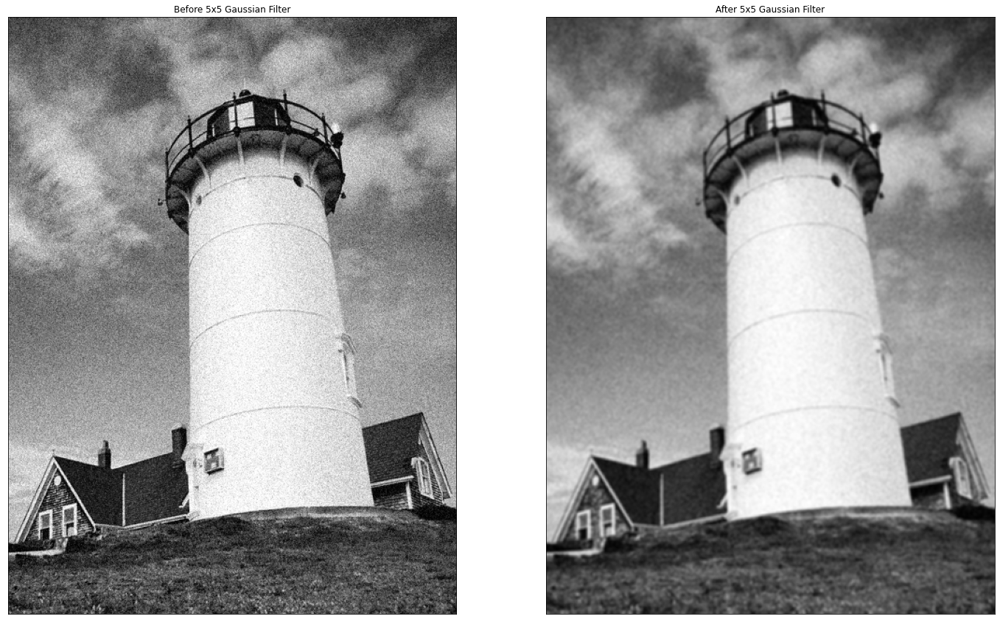

In [ ]:
# calculate sigma from variance since variance = sigma^2
sigma = sqrt(2)

# apply 5x5 Gaussian filter using the Gaussian Blur function from OpenCV
gaussian_lighthouse = cv2.GaussianBlur(gray_lighthouse, (5,5), sigma)

# display the results to compare the blur effect
plt.figure(figsize=(24, 24))
plt.subplot(121), plt.imshow(gray_lighthouse, cmap='gray')
plt.title('Before 5x5 Gaussian Filter'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(gaussian_lighthouse, cmap='gray')
plt.title('After 5x5 Gaussian Filter'), plt.xticks([]), plt.yticks([])

## Apply 5x5 Box Filter

(Text(0.5, 1.0, 'After 5x5 Box Filter'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

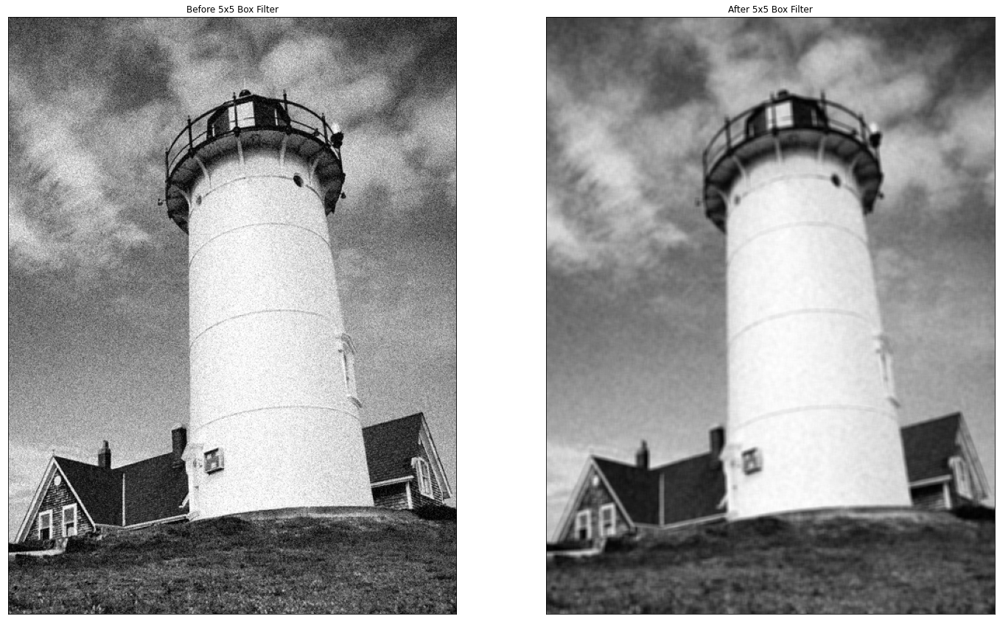

In [ ]:
# apply 5x5 Box filter using the blur method from OpenCV
box_lighthouse = cv2.blur(gray_lighthouse, (5,5))

# display the results to compare the blur effect
plt.figure(figsize=(24, 24))
plt.subplot(121), plt.imshow(gray_lighthouse, cmap='gray')
plt.title('Before 5x5 Box Filter'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(box_lighthouse, cmap='gray')
plt.title('After 5x5 Box Filter'), plt.xticks([]), plt.yticks([])

## Peak-Signal-to-Noise-Ratio (PSNR) Comparison

In [ ]:
# read clean lighthouse image and convert it into grayscale
clean_lighthouse = mpimage.imread(os.path.join(BASE_DIR, 'lighthouse.png'))
clean_lighthouse = cv2.cvtColor(clean_lighthouse, cv2.COLOR_RGB2GRAY)

# calculate the PSNR of the Gaussian Filter
gaussian_psnr = cv2.PSNR(gaussian_lighthouse, clean_lighthouse)

# calculate the PSNR of the Box Filter
box_psnr = cv2.PSNR(box_lighthouse, clean_lighthouse)

# print the results to compare them
print('PSNR of Gaussian Filtered Image to Clean Image: ' + str(gaussian_psnr))
print('PSNR of Box Filtered Image to Clean Image: ' + str(box_psnr))

PSNR of Gaussian Filtered Image to Clean Image: 74.8444423305363
PSNR of Box Filtered Image to Clean Image: 73.43441578175603


As it can be seen from the print statements, the PSNR of the Gaussian filtered image is higher than the PSNR of the Box filtered image. Since a higher value usually indicates a higher quality, we can say that the Gaussian filter did a better job at removing the noise compared to the box filter and therefore produced an image that is closer to the clean version.

## Read the Salt-and-Pepper Noisy Image

(<matplotlib.image.AxesImage at 0x7f7f465b8ef0>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

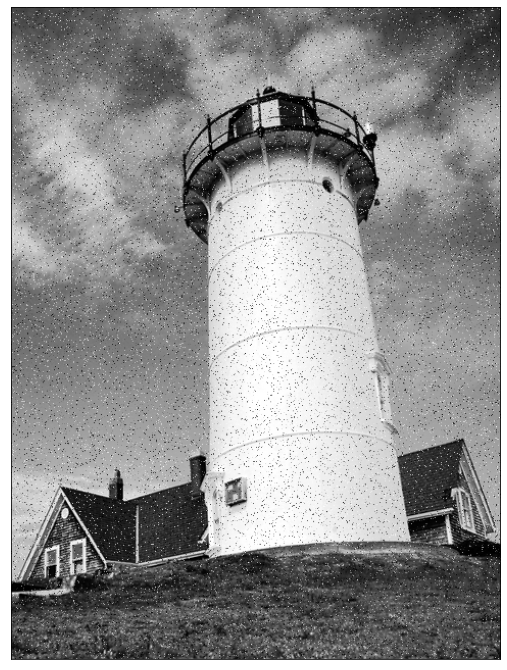

In [ ]:
# read the image and convert it to grayscale
snp_lighthouse = mpimage.imread(os.path.join(BASE_DIR, 'saltandpepper_lighthouse.png'))
snp_gray_lighthouse = cv2.cvtColor(snp_lighthouse, cv2.COLOR_RGB2GRAY)

# display the result to see if it converted to grayscale correctly
plt.figure(figsize=(12, 12))
plt.imshow(snp_gray_lighthouse, cmap='gray'), plt.xticks([]), plt.yticks([])

## Apply the 5x5 Gaussian Filter with a variance of 2

(([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

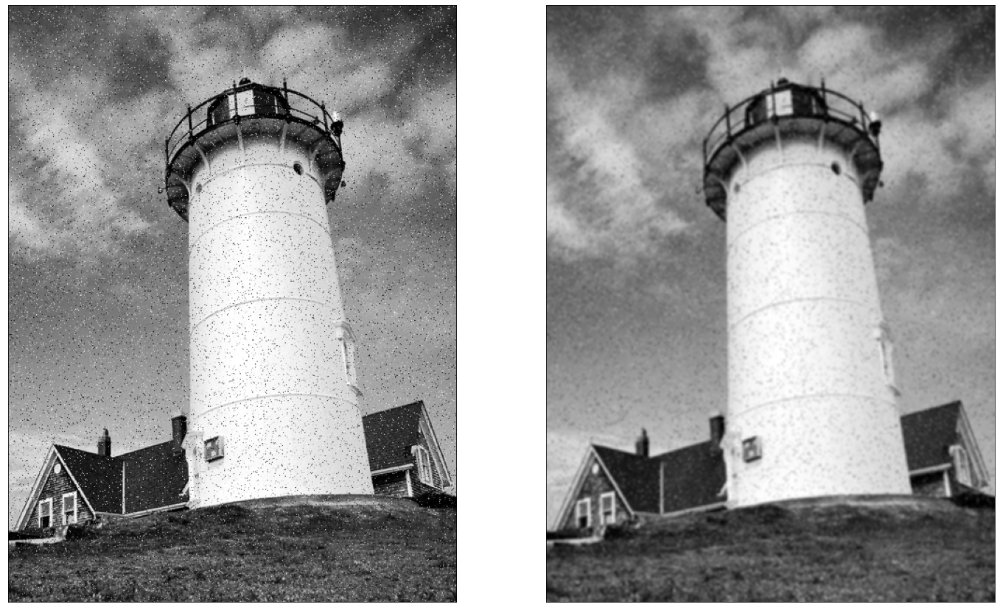

In [ ]:
# apply the gaussian filter to the noisy image
snp_gaussian_lighthouse = cv2.GaussianBlur(snp_gray_lighthouse, (5,5), sigma)

# compare the result with the original noisy image
plt.figure(figsize=(24, 24))
plt.subplot(121), plt.imshow(snp_gray_lighthouse, cmap='gray')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(snp_gaussian_lighthouse, cmap='gray')
plt.xticks([]), plt.yticks([])

## Apply 5x5 Median Filter

(<matplotlib.axes._subplots.AxesSubplot at 0x7f7f4639cf98>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

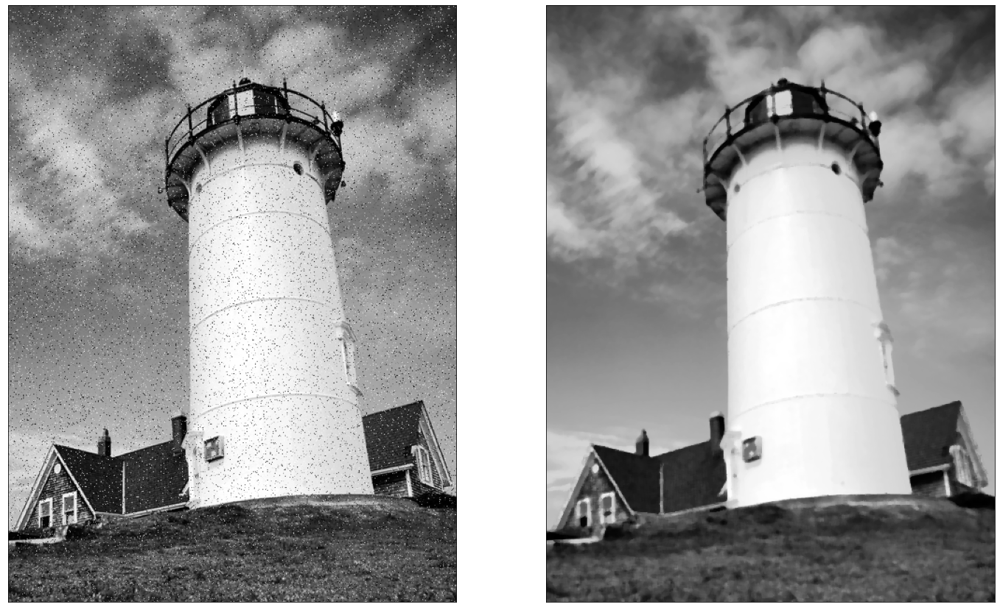

In [ ]:
# apply 5x5 median filter using the median filter function from OpenCV
snp_median_lighthouse = cv2.medianBlur(snp_gray_lighthouse, 5)

# compare the result with the original noisy image
plt.figure(figsize=(24, 24))
plt.subplot(121), plt.imshow(snp_gray_lighthouse, cmap='gray'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(snp_median_lighthouse, cmap='gray'), plt.xticks([]), plt.yticks([])

## Peak-Signal-to-Noise-Ratio (PSNR) Comparison

In [ ]:
# calculate PSNR of the Gaussian Filter
snp_gaussian_psnr = cv2.PSNR(snp_gaussian_lighthouse, clean_lighthouse)

# calculate PSNR of the Median Filter
snp_median_psnr = cv2.PSNR(snp_median_lighthouse, clean_lighthouse)

# print the results to compare them
print('PSNR of Gaussian Filtered Image to Clean Image: ' + str(snp_gaussian_psnr))
print('PSNR of Median Filtered Image to Clean Image: ' + str(snp_median_psnr))

PSNR of Gaussian Filtered Image to Clean Image: 74.33142928560473
PSNR of Median Filtered Image to Clean Image: 74.94424072039679


Here, the results are pretty close. However, median filter has a higher PSNR by a difference of ~ 0.6. This means that for the salt and pepper noise, median filter does a better job at producing a cleaner image compared to the gaussian filter.

# 3. Sobel Edge Detector

## Read the Clean Image

(<matplotlib.image.AxesImage at 0x7f7f462d4438>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

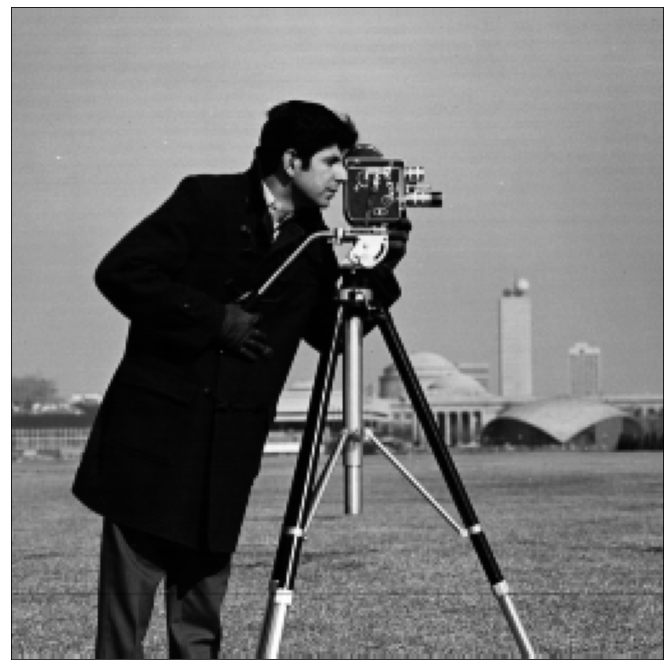

In [ ]:
# read the clean image
cameraman = mpimage.imread(os.path.join(BASE_DIR, 'cameraman.png'))

# display the image
plt.figure(figsize=(12, 12))
plt.imshow(cameraman, cmap='gray'), plt.xticks([]), plt.yticks([])

## Apply Sobel Edge Detector

(Text(0.5, 1.0, 'Sobel Edge Detector with Kernel Size of 7x7'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

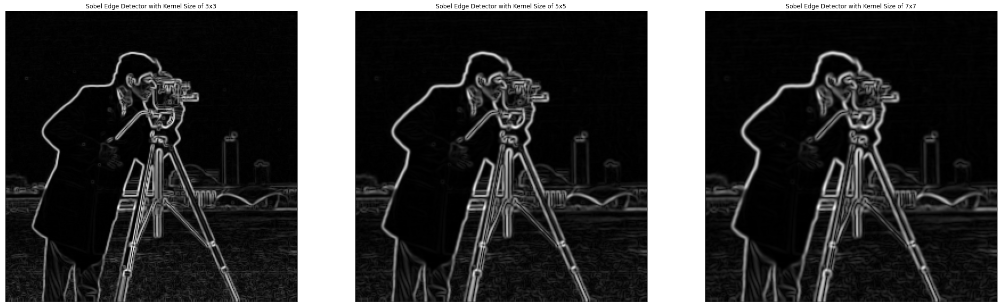

In [ ]:
# Apply 3x3 Sobel Edge Detector
sobel_3x3_x = cv2.Sobel(cameraman, cv2.CV_64F, 1, 0, ksize=3)
sobel_3x3_y = cv2.Sobel(cameraman, cv2.CV_64F, 0, 1, ksize=3)

# Apply 5x5 Sobel Edge Detector
sobel_5x5_x = cv2.Sobel(cameraman, cv2.CV_64F, 1, 0, ksize=5)
sobel_5x5_y = cv2.Sobel(cameraman, cv2.CV_64F, 0, 1, ksize=5)

# Apply 7x7 Sobel Edge Detector
sobel_7x7_x = cv2.Sobel(cameraman, cv2.CV_64F, 1, 0, ksize=7)
sobel_7x7_y = cv2.Sobel(cameraman, cv2.CV_64F, 0, 1, ksize=7)

# add the results of Sobel Edge Detections
sobel_3x3 = cv2.magnitude(sobel_3x3_x, sobel_3x3_y)
sobel_5x5 = cv2.magnitude(sobel_5x5_x, sobel_5x5_y)
sobel_7x7 = cv2.magnitude(sobel_7x7_x, sobel_7x7_y)

# display results
plt.figure(figsize=(36, 36))
plt.subplot(1, 3, 1), plt.imshow(sobel_3x3, cmap='gray')
plt.title('Sobel Edge Detector with Kernel Size of 3x3'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 2), plt.imshow(sobel_5x5, cmap='gray')
plt.title('Sobel Edge Detector with Kernel Size of 5x5'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 3), plt.imshow(sobel_7x7, cmap='gray')
plt.title('Sobel Edge Detector with Kernel Size of 7x7'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Sobel Edge Detector with Kernel Size of 7x7 After 10% Threshold'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

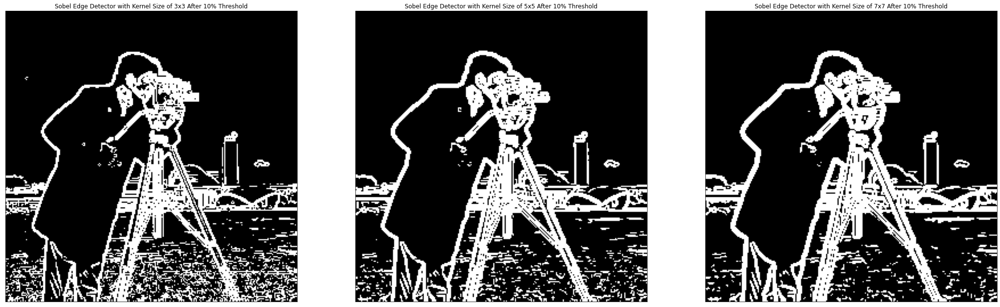

In [ ]:
# find the max pixel value in each image
sobel_3x3_max = np.amax(sobel_3x3)
sobel_5x5_max = np.amax(sobel_5x5)
sobel_7x7_max = np.amax(sobel_7x7)

# Apply 10% Threshold
sobel_3x3_t_10 = sobel_3x3 > (sobel_3x3_max * 0.1)
sobel_5x5_t_10 = sobel_5x5 > (sobel_5x5_max * 0.1)
sobel_7x7_t_10 = sobel_7x7 > (sobel_7x7_max * 0.1)

# display results
plt.figure(figsize=(36, 36))
plt.subplot(1, 3, 1), plt.imshow(sobel_3x3_t_10, cmap='gray')
plt.title('Sobel Edge Detector with Kernel Size of 3x3 After 10% Threshold'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 2), plt.imshow(sobel_5x5_t_10, cmap='gray')
plt.title('Sobel Edge Detector with Kernel Size of 5x5 After 10% Threshold'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 3), plt.imshow(sobel_7x7_t_10, cmap='gray')
plt.title('Sobel Edge Detector with Kernel Size of 7x7 After 10% Threshold'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Sobel Edge Detector with Kernel Size of 7x7 After 20% Threshold'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

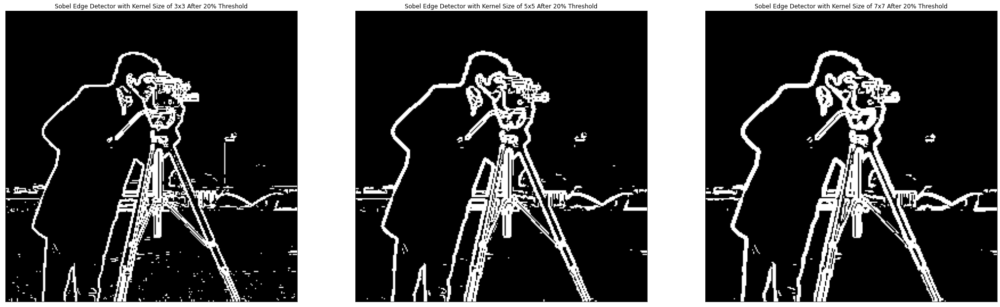

In [ ]:
# Apply 20% Threshold
sobel_3x3_t_20 = sobel_3x3 > (sobel_3x3_max * 0.2)
sobel_5x5_t_20 = sobel_5x5 > (sobel_5x5_max * 0.2)
sobel_7x7_t_20 = sobel_7x7 > (sobel_7x7_max * 0.2)

# display the results
plt.figure(figsize=(36, 36))
plt.subplot(1, 3, 1), plt.imshow(sobel_3x3_t_20, cmap='gray')
plt.title('Sobel Edge Detector with Kernel Size of 3x3 After 20% Threshold'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 2), plt.imshow(sobel_5x5_t_20, cmap='gray')
plt.title('Sobel Edge Detector with Kernel Size of 5x5 After 20% Threshold'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 3), plt.imshow(sobel_7x7_t_20, cmap='gray')
plt.title('Sobel Edge Detector with Kernel Size of 7x7 After 20% Threshold'), plt.xticks([]), plt.yticks([])

As it can be seen from the thresholded images, kernel size has a considerable effect on the detected edges.

- With a 3x3 kernel, we are able to detect the edges of the buildings in the background and also the edges of the individual grass leaves. This means that depending on what information we want to get out of the image, we can use this kernel size to get as many edges as possible and also increase the amount of detail we get.

- With a 5x5 kernel, we are in a middle ground. With the help of thresholding, we can see that the detected edges get thicker and we lose some of the detail we got using a 3x3 kernel. However, we can still easily detect the edges of the man and the camera.

- With a 7x7 kernel, the edges after threshold are the thickest. Especially using a 20% threshold, we can segment the edges of the man and camera from the edges of the buildings in the background and from the edges of the grass. This means that we can use this filter to detect the edges of the objects that are closer to the camera.

## Sobel Edge Detection with A Noisy Image

(<matplotlib.image.AxesImage at 0x7f7f460ba4a8>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

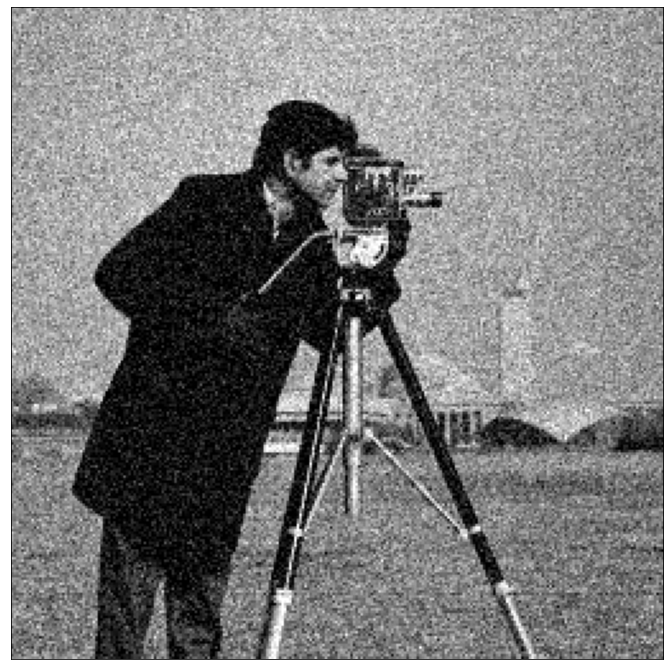

In [ ]:
# Read the Noisy Image
noisy_cameraman = mpimage.imread(os.path.join(BASE_DIR, 'gaussian_cameraman.png'))

#display the results
plt.figure(figsize=(12, 12))
plt.imshow(noisy_cameraman, cmap='gray'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Threshold 20% of the max pixel value'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

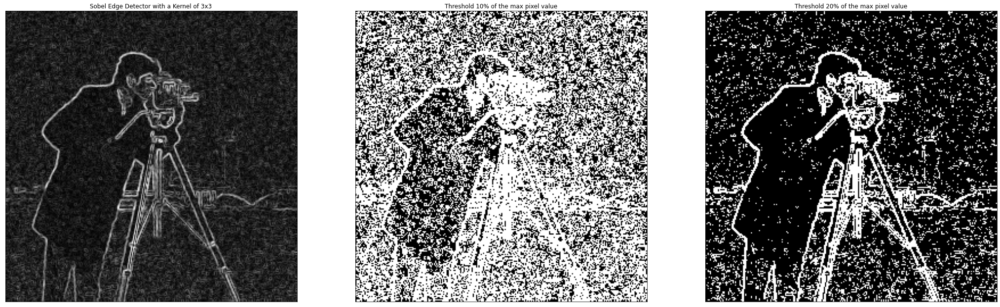

In [ ]:
# apply Sobel Edge detector with the kernel size of 3x3
noisy_sobel_x = cv2.Sobel(noisy_cameraman, cv2.CV_64F, 1, 0, 3)
noisy_sobel_y = cv2.Sobel(noisy_cameraman, cv2.CV_64F, 0, 1, 3)

# combine the x and y edges to get all the detected edges
noisy_sobel = cv2.magnitude(noisy_sobel_x, noisy_sobel_y)

# get the max pixel value of the image
noisy_sobel_max = np.amax(noisy_sobel)

# threshold the image to 10% and 20% of the max pixel value
noisy_sobel_t10 = noisy_sobel > (noisy_sobel_max * 0.1)
noisy_sobel_t20 = noisy_sobel > (noisy_sobel_max * 0.2)

# display the results to compare them
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(noisy_sobel, cmap='gray')
plt.title('Sobel Edge Detector with a Kernel of 3x3'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(noisy_sobel_t10, cmap='gray')
plt.title('Threshold 10% of the max pixel value'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(noisy_sobel_t20, cmap='gray')
plt.title('Threshold 20% of the max pixel value'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Threshold 20% of the max pixel value'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

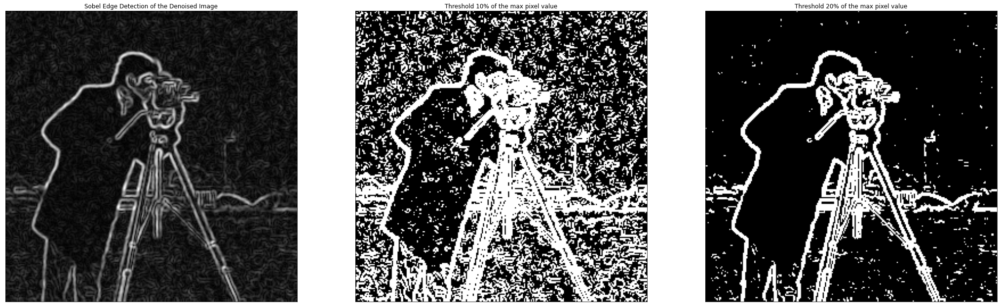

In [ ]:
# denoise the image using a 3x3 box filter
denoised_cameraman = cv2.blur(noisy_cameraman, (3,3))

# apply Sobel Edge detector to the denoised image
denoised_sobel_x = cv2.Sobel(denoised_cameraman, cv2.CV_64F, 1, 0, 3)
denoised_sobel_y = cv2.Sobel(denoised_cameraman, cv2.CV_64F, 0, 1, 3)

# combine the x and y edges
denoised_sobel = cv2.magnitude(denoised_sobel_x, denoised_sobel_y)

# get the max pixel value of the image
denoised_sobel_max = np.amax(denoised_sobel)

# threshold the image to 10% and 20% of the max pixel value
denoised_sobel_t10 = denoised_sobel > (denoised_sobel_max * 0.1)
denoised_sobel_t20 = denoised_sobel > (denoised_sobel_max * 0.2)

# display the results for comparison
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(denoised_sobel, cmap='gray')
plt.title('Sobel Edge Detection of the Denoised Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(denoised_sobel_t10, cmap='gray')
plt.title('Threshold 10% of the max pixel value'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(denoised_sobel_t20, cmap='gray')
plt.title('Threshold 20% of the max pixel value'), plt.xticks([]), plt.yticks([])

As it can be seen, denoisinng prior to edge decetions helps with correctly detecting the edges in an image. If we do not denoise the image, we can see that Sobel Edge Detection picks up the noise as edges as well, and therefore we get a very noisy image after thresholding.

However, if we apply denoising and then apply Sobel Edge detection, we can see that we can reduce the detection of the noise as edges, especially for the thresholding with 20% of the max pixel value. Therefore, it can be seen that denoising before edge detection is an important step to better detect the edges.

# 4. Canny Edge Detection

## 4 Main steps of Canny Edge Detection

The 4 main steps of the Canny Edge Detection are as following:

1. Filter image with x, y derivates of Gaussian
2. Find magnitude and orientation of gradient
3. Thin multi-pixel wide "ridges" down to single pixel width
4. Define 2 thresholds and use the high threshold to start edge curves and the low threshold to continue them

## Applying Canny Edge Detection with Various Values

(<matplotlib.image.AxesImage at 0x7f7f46363c88>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

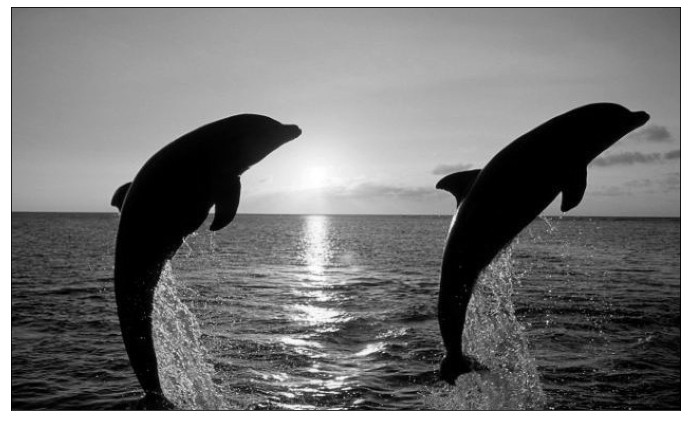

In [ ]:
# read the image as grayscale
dolphin = cv2.imread(os.path.join(BASE_DIR, 'dolphin.jpg'), cv2.IMREAD_GRAYSCALE)

# display the image before canny edge detection
plt.figure(figsize=(12, 12))
plt.imshow(dolphin, cmap='gray'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Canny Edge Detection with (K, L, H) = (5, 10, 200)'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

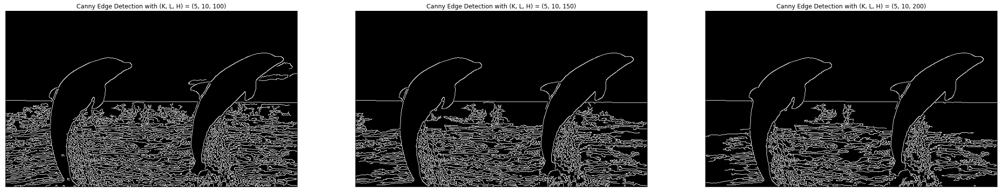

In [ ]:
# canny edge detection with K = 5, L = 10, H = 100
gaussian_dolphin1 = cv2.GaussianBlur(dolphin, (5, 5), 1)
canny_dolphin1 = cv2.Canny(gaussian_dolphin1, 10, 100)

# canny edge detection with K = 5, L = 10, H = 150
gaussian_dolphin2 = cv2.GaussianBlur(dolphin, (5, 5), 1)
canny_dolphin2 = cv2.Canny(gaussian_dolphin1, 10, 150)

# canny edge detection with K = 5, L = 10, H = 200
gaussian_dolphin3 = cv2.GaussianBlur(dolphin, (5, 5), 1)
canny_dolphin3 = cv2.Canny(gaussian_dolphin1, 10, 200)

# display the result of this triplet
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(canny_dolphin1, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (5, 10, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(canny_dolphin2, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (5, 10, 150)'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(canny_dolphin3, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (5, 10, 200)'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Canny Edge Detection with (K, L, H) = (5, 30, 200)'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

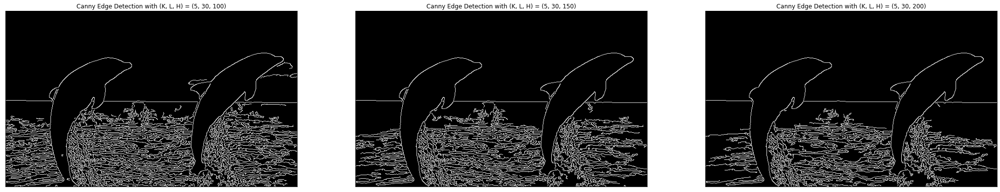

In [ ]:
# canny edge detection with K = 5, L = 30, H = 100
gaussian_dolphin4 = cv2.GaussianBlur(dolphin, (5, 5), 1)
canny_dolphin4 = cv2.Canny(gaussian_dolphin1, 30, 100)

# canny edge detection with K = 5, L = 30, H = 150
gaussian_dolphin5 = cv2.GaussianBlur(dolphin, (5, 5), 1)
canny_dolphin5 = cv2.Canny(gaussian_dolphin1, 30, 150)

# canny edge detection with K = 5, L = 30, H = 200
gaussian_dolphin6 = cv2.GaussianBlur(dolphin, (5, 5), 1)
canny_dolphin6 = cv2.Canny(gaussian_dolphin1, 30, 200)

# display the result of this triplet
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(canny_dolphin4, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (5, 30, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(canny_dolphin5, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (5, 30, 150)'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(canny_dolphin6, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (5, 30, 200)'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Canny Edge Detection with (K, L, H) = (5, 50, 200)'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

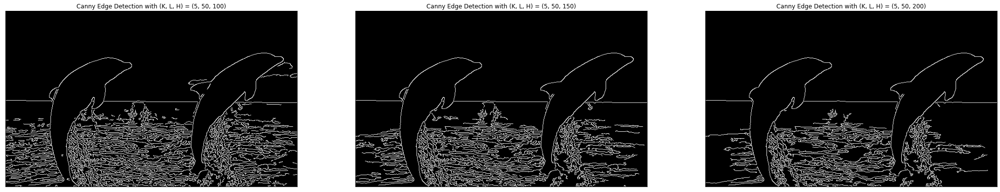

In [ ]:
# canny edge detection with K = 5, L = 50, H = 100
gaussian_dolphin7 = cv2.GaussianBlur(dolphin, (5, 5), 1)
canny_dolphin7 = cv2.Canny(gaussian_dolphin1, 50, 100)

# canny edge detection with K = 5, L = 50, H = 150
gaussian_dolphin8 = cv2.GaussianBlur(dolphin, (5, 5), 1)
canny_dolphin8 = cv2.Canny(gaussian_dolphin1, 50, 150)

# canny edge detection with K = 5, L = 50, H = 200
gaussian_dolphin9 = cv2.GaussianBlur(dolphin, (5, 5), 1)
canny_dolphin9 = cv2.Canny(gaussian_dolphin1, 50, 200)

# display the result of this triplet
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(canny_dolphin7, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (5, 50, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(canny_dolphin8, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (5, 50, 150)'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(canny_dolphin9, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (5, 50, 200)'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Canny Edge Detection with (K, L, H) = (9, 10, 200)'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

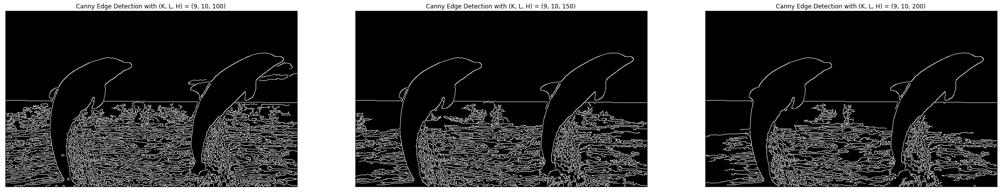

In [ ]:
# canny edge detection with K = 9, L = 10, H = 100
gaussian_dolphin10 = cv2.GaussianBlur(dolphin, (9, 9), 1)
canny_dolphin10 = cv2.Canny(gaussian_dolphin1, 10, 100)

# canny edge detection with K = 9, L = 10, H = 150
gaussian_dolphin11 = cv2.GaussianBlur(dolphin, (9, 9), 1)
canny_dolphin11 = cv2.Canny(gaussian_dolphin1, 10, 150)

# canny edge detection with K = 9, L = 10, H = 200
gaussian_dolphin12 = cv2.GaussianBlur(dolphin, (9, 9), 1)
canny_dolphin12 = cv2.Canny(gaussian_dolphin1, 10, 200)

# display the result of this triplet
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(canny_dolphin10, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (9, 10, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(canny_dolphin11, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (9, 10, 150)'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(canny_dolphin12, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (9, 10, 200)'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Canny Edge Detection with (K, L, H) = (9, 30, 200)'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

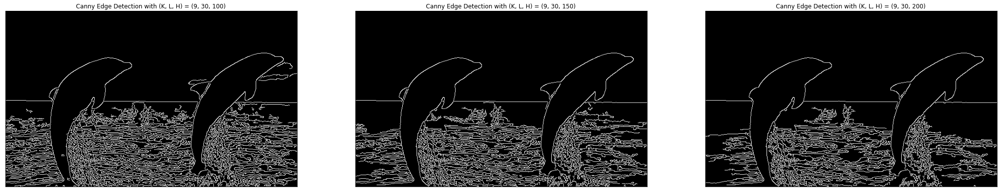

In [ ]:
# canny edge detection with K = 9, L = 30, H = 100
gaussian_dolphin13 = cv2.GaussianBlur(dolphin, (9, 9), 1)
canny_dolphin13 = cv2.Canny(gaussian_dolphin1, 30, 100)

# canny edge detection with K = 9, L = 30, H = 150
gaussian_dolphin14 = cv2.GaussianBlur(dolphin, (9, 9), 1)
canny_dolphin14 = cv2.Canny(gaussian_dolphin1, 30, 150)

# canny edge detection with K = 9, L = 30, H = 200
gaussian_dolphin15 = cv2.GaussianBlur(dolphin, (9, 9), 1)
canny_dolphin15 = cv2.Canny(gaussian_dolphin1, 30, 200)

# display the result of this triplet
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(canny_dolphin13, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (9, 30, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(canny_dolphin14, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (9, 30, 150)'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(canny_dolphin15, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (9, 30, 200)'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Canny Edge Detection with (K, L, H) = (9, 50, 200)'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

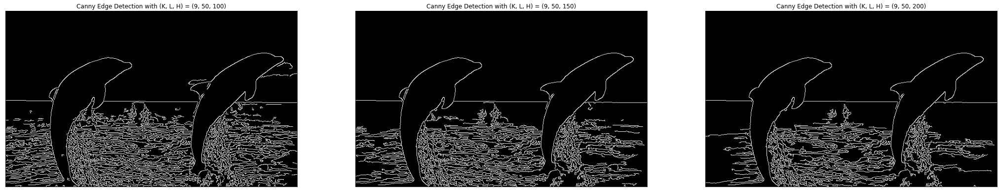

In [ ]:
# canny edge detection with K = 9, L = 50, H = 100
gaussian_dolphin16 = cv2.GaussianBlur(dolphin, (9, 9), 1)
canny_dolphin16 = cv2.Canny(gaussian_dolphin1, 50, 100)

# canny edge detection with K = 9, L = 50, H = 150
gaussian_dolphin17 = cv2.GaussianBlur(dolphin, (9, 9), 1)
canny_dolphin17 = cv2.Canny(gaussian_dolphin1, 50, 150)

# canny edge detection with K = 9, L = 50, H = 200
gaussian_dolphin18 = cv2.GaussianBlur(dolphin, (9, 9), 1)
canny_dolphin18 = cv2.Canny(gaussian_dolphin1, 50, 200)

# display the result of this triplet
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(canny_dolphin16, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (9, 50, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(canny_dolphin17, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (9, 50, 150)'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(canny_dolphin18, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (9, 50, 200)'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Canny Edge Detection with (K, L, H) = (13, 10, 200)'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

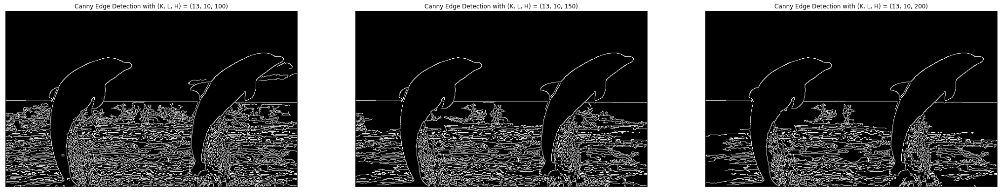

In [ ]:
# canny edge detection with K = 13, L = 10, H = 100
gaussian_dolphin19 = cv2.GaussianBlur(dolphin, (13, 13), 1)
canny_dolphin19 = cv2.Canny(gaussian_dolphin1, 10, 100)

# canny edge detection with K = 13, L = 10, H = 150
gaussian_dolphin20 = cv2.GaussianBlur(dolphin, (13, 13), 1)
canny_dolphin20 = cv2.Canny(gaussian_dolphin1, 10, 150)

# canny edge detection with K = 13, L = 10, H = 200
gaussian_dolphin21 = cv2.GaussianBlur(dolphin, (13, 13), 1)
canny_dolphin21 = cv2.Canny(gaussian_dolphin1, 10, 200)

# display the result of this triplet
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(canny_dolphin19, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (13, 10, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(canny_dolphin20, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (13, 10, 150)'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(canny_dolphin21, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (13, 10, 200)'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Canny Edge Detection with (K, L, H) = (13, 30, 200)'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

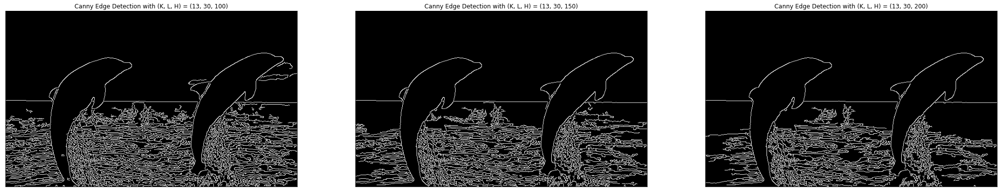

In [ ]:
# canny edge detection with K = 13, L = 30, H = 100
gaussian_dolphin22 = cv2.GaussianBlur(dolphin, (13, 13), 1)
canny_dolphin22 = cv2.Canny(gaussian_dolphin1, 30, 100)

# canny edge detection with K = 13, L = 30, H = 150
gaussian_dolphin23 = cv2.GaussianBlur(dolphin, (13, 13), 1)
canny_dolphin23 = cv2.Canny(gaussian_dolphin1, 30, 150)

# canny edge detection with K = 13, L = 30, H = 200
gaussian_dolphin24 = cv2.GaussianBlur(dolphin, (13, 13), 1)
canny_dolphin24 = cv2.Canny(gaussian_dolphin1, 30, 200)

# display the result of this triplet
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(canny_dolphin22, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (13, 30, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(canny_dolphin23, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (13, 30, 150)'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(canny_dolphin24, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (13, 30, 200)'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Canny Edge Detection with (K, L, H) = (13, 50, 200)'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

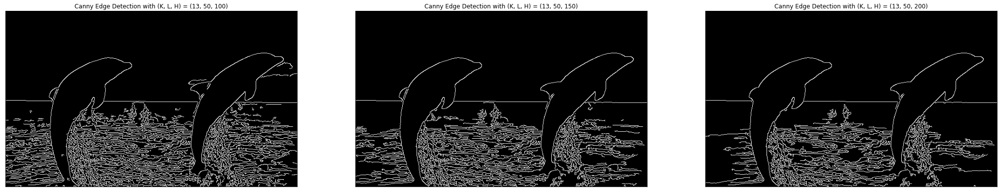

In [ ]:
# canny edge detection with K = 13, L = 50, H = 100
gaussian_dolphin25 = cv2.GaussianBlur(dolphin, (13, 13), 1)
canny_dolphin25 = cv2.Canny(gaussian_dolphin1, 50, 100)

# canny edge detection with K = 13, L = 50, H = 150
gaussian_dolphin26 = cv2.GaussianBlur(dolphin, (13, 13), 1)
canny_dolphin26 = cv2.Canny(gaussian_dolphin1, 50, 150)

# canny edge detection with K = 13, L = 50, H = 200
gaussian_dolphin27 = cv2.GaussianBlur(dolphin, (13, 13), 1)
canny_dolphin27 = cv2.Canny(gaussian_dolphin1, 50, 200)

# display the result of this triplet
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(canny_dolphin25, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (13, 50, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(canny_dolphin26, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (13, 50, 150)'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(canny_dolphin27, cmap='gray')
plt.title('Canny Edge Detection with (K, L, H) = (13, 50, 200)'), plt.xticks([]), plt.yticks([])

Looking at the 27 images above, it is possible to see some relationships between some of the hyper-parameters.

- To start with, we can see that increasing the H value from 100 to 200 decreases the amount of edges detected on the sea. This means that as H increases we can get closer to picking up sharper edges.

- Another relationship is that, as we increase the L value from 10 to 50, we can also see that clouds in the background are slowly disappearing. This means that L value helps us to eliminate the not so sharp edges that are detected, therefore bringing up the sharper edges.

- Lastly, increasing the gaussian hyper-parameter K from 5 to 13, we start to decrease the number of edges picked up from the sea level again as well. This can be used to decreased the number of edges detected on a surface with the same gradient, therefore helping to distinguish the edges where there is a color change or a gradient change.

## Find Hyper-Parameter Values Such That only the Dolphins Show Up

(<matplotlib.image.AxesImage at 0x7f7f44d28a20>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

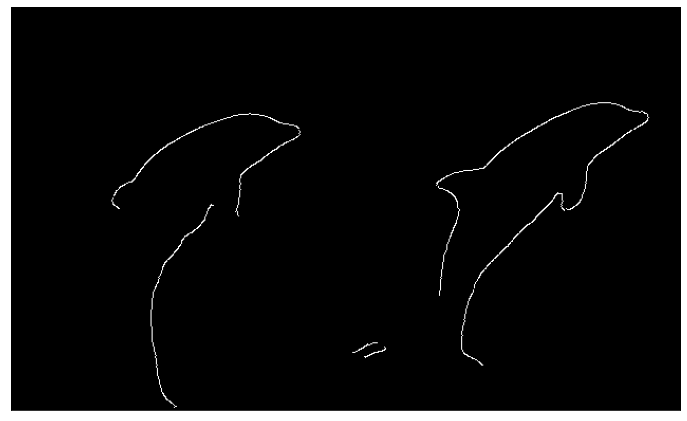

In [ ]:
# canny edge detection with (K, L, H) = (21, 75, 135)
gaussian_dolphin_only = cv2.GaussianBlur(dolphin, (21, 21), 0)
canny_dolphin_only = cv2.Canny(gaussian_dolphin_only, 75, 135)

# display the result
plt.figure(figsize=(12, 12))
plt.imshow(canny_dolphin_only, cmap='gray'), plt.xticks([]), plt.yticks([])

# 5. Harris Corner Detection

## Read Images for Corner Detection

(<matplotlib.axes._subplots.AxesSubplot at 0x7f7f465199b0>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

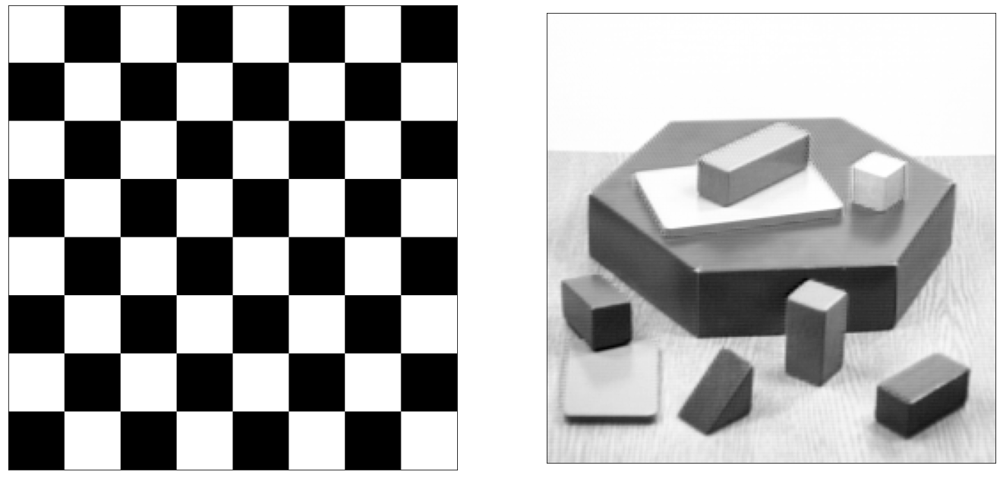

In [ ]:
# read checkerboard image
checkerboard = cv2.imread(os.path.join(BASE_DIR, 'checkerboard.png'))
shapes = cv2.imread(os.path.join(BASE_DIR, 'shapes.png'))

# convert to grayscale
gray_checkerboard = cv2.cvtColor(checkerboard, cv2.COLOR_RGB2GRAY)
gray_shapes = cv2.cvtColor(shapes, cv2.COLOR_RGB2GRAY)

# display the images
plt.figure(figsize=(36, 36))
plt.subplot(131), plt.imshow(gray_checkerboard, cmap='gray'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(gray_shapes, cmap='gray'), plt.xticks([]), plt.yticks([])

## Harris Corner Detection

In [ ]:
# step 1: compute image derivatives (Will use Sobel Filter for this)
def derivative_x(img):
  sobel_filter_x = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
  return cv2.filter2D(img, cv2.CV_64F, sobel_filter_x)

def derivative_y(img):
  sobel_filter_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
  return cv2.filter2D(img, cv2.CV_64F, sobel_filter_y)

# step 2: calculate square of derivatives
def square_of_derivates(derivate1, derivate2):
  return derivate1 * derivate2

# step 3: apply gaussian filter
def gaussian_filter(img):
  return cv2.GaussianBlur(img, (0, 0), 1)

# step 4: determinant(H) - kTrace(H)^2, k = 0.05
def get_cornerness(Ixx, Iyy, Ixy):
  # calculate determinant(H)
  determinant = (Ixx * Iyy) - (Ixy ** 2)
  trace = Ixx + Iyy
  return determinant - (0.05 * (trace ** 2))

# step 5: perform non-maxima suppression
def non_maxima_suppresion(img, threshold=1.0):
  cv2.normalize(img, img, 0, 2, cv2.NORM_MINMAX)
  loc = np.where(img >= threshold)
  return loc

# combine steps for one function
def harris_corners(img, gray_img, circle, threshold=1.0):
  img_x = derivative_x(gray_img)
  img_y = derivative_y(gray_img)

  img_xx = square_of_derivates(img_x, img_x)
  img_yy = square_of_derivates(img_y, img_y)
  img_xy = square_of_derivates(img_x, img_y)

  img_xx = gaussian_filter(img_xx)
  img_yy = gaussian_filter(img_yy)
  img_xy = gaussian_filter(img_xy)

  cornerness_response = get_cornerness(img_xx, img_yy, img_xy)

  loc = non_maxima_suppresion(cornerness_response, threshold)

  result = img.copy()

  for point in zip(*loc[::-1]):
    cv2.circle(result, point, circle, (255, 0, 0), -1)

  return result

(Text(0.5, 1.0, 'Harris Corners with Threshold 2.0'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

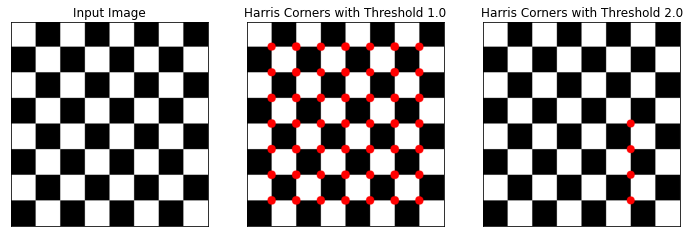

In [ ]:
# apply harris corner detection to checkerboard
checkerboard_corners_t1_0 = harris_corners(checkerboard, gray_checkerboard, 15)
checkerboard_corners_t2_0 = harris_corners(checkerboard, gray_checkerboard, 15, 2.0)

# display the result
plt.figure(figsize=(12, 12))
plt.subplot(131), plt.imshow(checkerboard)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(checkerboard_corners_t1_0)
plt.title('Harris Corners with Threshold 1.0'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(checkerboard_corners_t2_0)
plt.title('Harris Corners with Threshold 2.0'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Harris Corners with Threshold 1.5'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

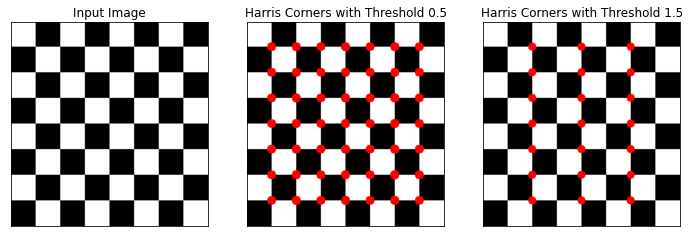

In [ ]:
# apply harris corner detection to checkerboard
checkerboard_corners_t0_5 = harris_corners(checkerboard, gray_checkerboard, 15, 0.5)
checkerboard_corners_t1_5 = harris_corners(checkerboard, gray_checkerboard, 15, 1.5)

# display the results
plt.figure(figsize=(12, 12))
plt.subplot(131), plt.imshow(checkerboard)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(checkerboard_corners_t0_5)
plt.title('Harris Corners with Threshold 0.5'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(checkerboard_corners_t1_5)
plt.title('Harris Corners with Threshold 1.5'), plt.xticks([]), plt.yticks([])

As it can be seen from 4 different threshold values, varying the threshold value has an impact on the corners detected on the image. Since we are normalizing the image with values 0 and 2, choosing a threshold value that is higher than 50% of the max value (in our case 50% of 2, which is 1) results in the loss of corner detection. We start to pick up less of the corners. Therefore, I suggest that keeping the threshold value lower than 50% of the normalized max value will result in the best corner detection.

(Text(0.5, 1.0, 'Harris Corners with Threshold 1.5'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

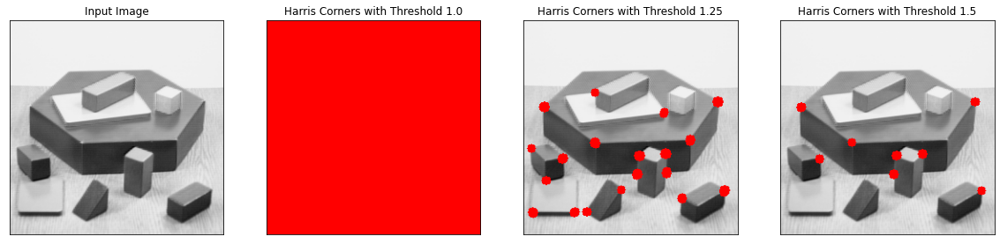

In [ ]:
# apply harris corner detection to shapes
shapes_corners_t1_0 = harris_corners(shapes, gray_shapes, 5)
shapes_corners_t1_25 = harris_corners(shapes, gray_shapes, 5, 1.25)
shapes_corners_t1_5 = harris_corners(shapes, gray_shapes, 5, 1.5)

# compare the results
plt.figure(figsize=(20, 20))
plt.subplot(141), plt.imshow(shapes)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(shapes_corners_t1_0)
plt.title('Harris Corners with Threshold 1.0'), plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(shapes_corners_t1_25)
plt.title('Harris Corners with Threshold 1.25'), plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(shapes_corners_t1_5)
plt.title('Harris Corners with Threshold 1.5'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Harris Corners with Threshold 1.75'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

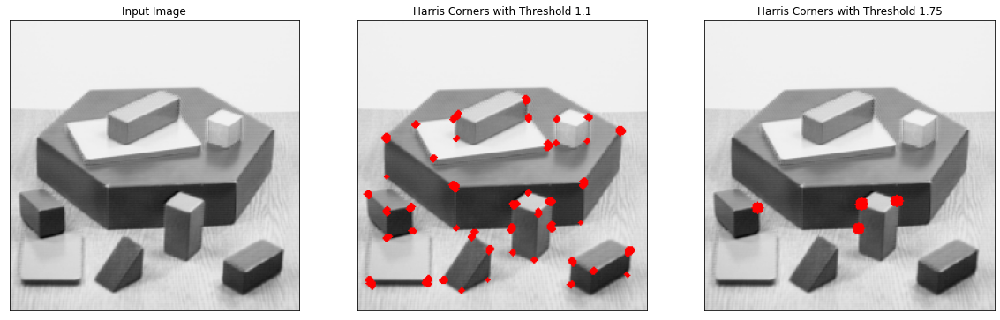

In [ ]:
# apply harris corner detection to shapes
shapes_corners_t1_1 = harris_corners(shapes, gray_shapes, 2, 1.1)
shapes_corners_t1_75 = harris_corners(shapes, gray_shapes, 5, 1.75)

# compare the results
plt.figure(figsize=(20, 20))
plt.subplot(131), plt.imshow(shapes)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(shapes_corners_t1_1)
plt.title('Harris Corners with Threshold 1.1'), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(shapes_corners_t1_75)
plt.title('Harris Corners with Threshold 1.75'), plt.xticks([]), plt.yticks([])

As it can be seen from the images above, threshold value of 50% of the max normalization value did not work for this image. We get a completely red image. Therefore for this image, the threshold had to taken more than 50% in order to get the corners. Most corners are detected when the threshold value is 55% of the max value. After than value, we start lose some of the corners as we get closer to the max value. For this image, it might be better to normalize the to a higher max value so we can detect the corners better.

## Harris Corner Detection on a face image from Google Face thumbnail collection

(<matplotlib.axes._subplots.AxesSubplot at 0x7f7f45be9390>,
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

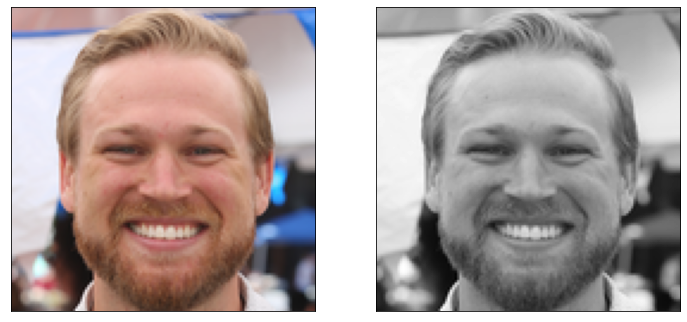

In [ ]:
# read thumbnail image 69991.png from Google Face thumbnail collection, inside folder 69000
thumbnail = cv2.imread(os.path.join(BASE_DIR, '69991.png'))
thumbnail = cv2.cvtColor(thumbnail, cv2.COLOR_BGR2RGB)
gray_thumbnail = cv2.cvtColor(thumbnail, cv2.COLOR_RGB2GRAY)

# display results
plt.figure(figsize=(12, 12))
plt.subplot(121), plt.imshow(thumbnail), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(gray_thumbnail, cmap='gray'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Harris Corners with Threshold 1.25'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

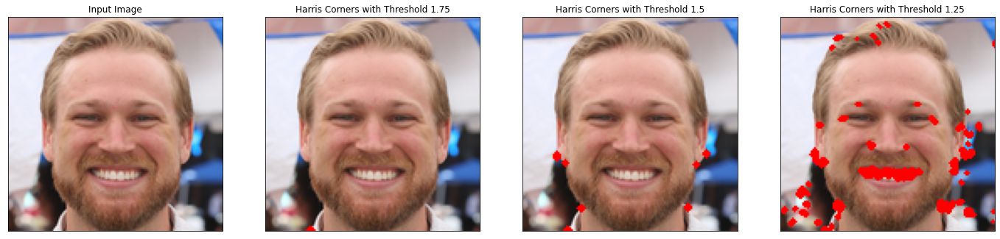

In [ ]:
# apply harris corner detection to the thumbnail
thumbnail_corners_t1_75 = harris_corners(thumbnail, gray_thumbnail, 2, 1.75)
thumbnail_corners_t1_5 = harris_corners(thumbnail, gray_thumbnail, 2, 1.5)
thumbnail_corners_t1_25 = harris_corners(thumbnail, gray_thumbnail, 1, 1.25)

# display the results
plt.figure(figsize=(24, 24))
plt.subplot(141), plt.imshow(thumbnail)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(thumbnail_corners_t1_75)
plt.title('Harris Corners with Threshold 1.75'), plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(thumbnail_corners_t1_5)
plt.title('Harris Corners with Threshold 1.5'), plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(thumbnail_corners_t1_25)
plt.title('Harris Corners with Threshold 1.25'), plt.xticks([]), plt.yticks([])

As it can be seen from the images above, we are again working with threshold values that are higher than 50% of the normalized maximum value. If we keep the value low (1.25) we are able to detect a lot of the corners, for example the corners of the teeth. However, it is hard to distinguish individual corners from each other after painting circles. As we increase the threshold value, we slowly see that less corners are picked up by the detector. For example, for threshold value 1.5, we are able to get the edges that are on the outline of the man. This could be useful to detect the person's face or can be used for autofocus for example. If we increase the threshold a bit further (1.75) we see that we can't pick up any more edges. Only edge shows up in our output which is not helpful to conclude anything.